In [1]:
import numpy as np
import cv2
import os
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import csv
from scipy.ndimage import sobel

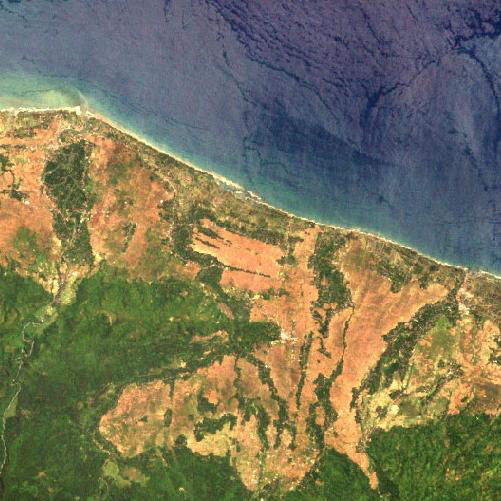

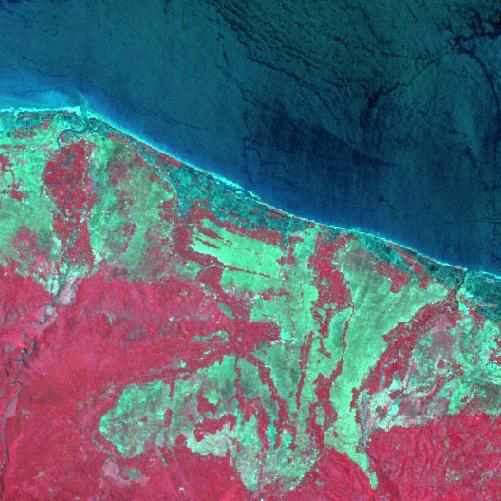

In [2]:
img = Image.open("C://Users//Trust_pc_dz//Documents//ISAT//TP2ISAT//Satellite_Imagery_Analysis//TPISAT-3//imag sat//NaturalColorImages.jpg")
display(img)
img2 = Image.open("C://Users//Trust_pc_dz//Documents//ISAT//TP2ISAT//Satellite_Imagery_Analysis//TPISAT-3//imag sat//FalseColorImages.jpg")
display(img2)

In [3]:
def display_images_in_grid(images, titles='',N=2, M=2,display=False,gray=False):

    fig, axs = plt.subplots(N, M, figsize=(15, 15))  
    
    for i, ax in enumerate(axs.flat):  
        if i < len(images): 
            if gray == True :
                ax.imshow(images[i], cmap='gray') 
            else :
                ax.imshow(images[i]) 
            if display == True: 
                ax.set_title(titles[i])  
            ax.axis('off')  
        else:
            ax.axis('off')  

    plt.tight_layout()
    plt.show()
    
def Split_RGB(img):

    img = np.array(img)
    R = img[:, :, 0]  
    G = img[:, :, 1]  
    B = img[:, :, 2]  

    return R, G, B

def Split_RGB_precessing(img):
    RGB_split_images = Split_RGB(img)
    display_images_in_grid(RGB_split_images,['R','G','B'],1,3,True,True)
    return RGB_split_images 



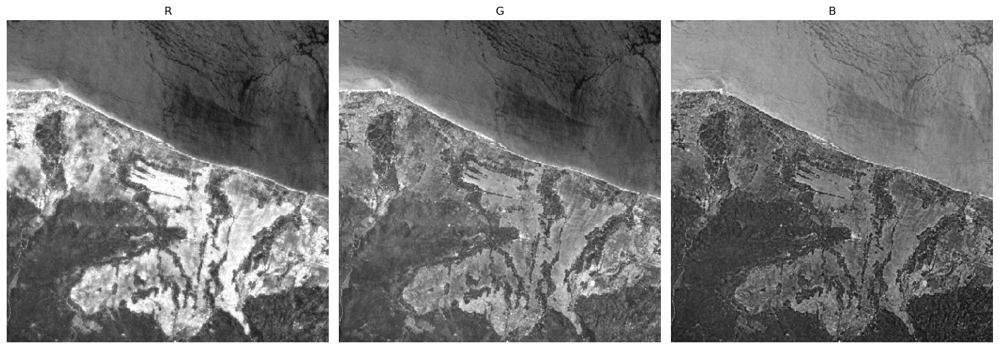

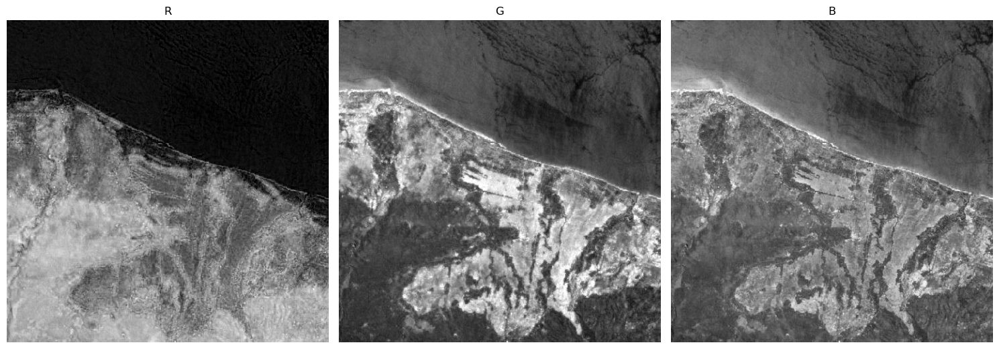

(array([[ 23,  18,  24, ...,  23,  14,   3],
        [  2,   0,   4, ...,  19,  10,   0],
        [  0,   0,   8, ...,  20,   9,   0],
        ...,
        [136, 133, 144, ..., 182, 178, 171],
        [143, 144, 151, ..., 180, 174, 168],
        [147, 151, 158, ..., 180, 171, 163]], dtype=uint8),
 array([[69, 64, 72, ..., 62, 53, 42],
        [52, 48, 54, ..., 61, 49, 36],
        [44, 51, 62, ..., 62, 51, 38],
        ...,
        [55, 48, 50, ..., 82, 79, 75],
        [62, 56, 57, ..., 75, 69, 63],
        [64, 63, 63, ..., 69, 60, 52]], dtype=uint8),
 array([[119, 114, 121, ...,  77,  68,  57],
        [101,  97, 103, ...,  75,  64,  51],
        [ 91,  98, 109, ...,  78,  67,  54],
        ...,
        [ 74,  69,  74, ..., 110, 107, 102],
        [ 81,  78,  81, ..., 105,  99,  93],
        [ 84,  85,  87, ..., 101,  92,  84]], dtype=uint8))

In [4]:
Split_RGB_precessing(img)
Split_RGB_precessing(img2)

In [8]:
def convolve(image, kernel):
    fh, fw = kernel.shape
    ih, iw = image.shape
    filtered_image = np.zeros_like(image)
    padded_image = np.pad(image, ((fh // 2, fh // 2), (fw // 2, fw // 2)), mode='reflect')

    for y in range(ih):
        for x in range(iw):
            window = padded_image[y:y + fh, x:x + fw]
            result = np.sum(window * kernel)
            filtered_image[y, x] = result

    return filtered_image

In [29]:
def sobel(image, threshold):
    image_array = np.array(image, dtype=np.float64)

    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])

    sobel_y = np.array([[-1, -2, -1],
                        [ 0,  0,  0],
                        [ 1,  2,  1]])

    edges_x = convolve(image_array, sobel_x)
    edges_y = convolve(image_array, sobel_y)

    # Calculer la magnitude des gradients
    amplitude = np.sqrt(edges_x**2 + edges_y**2)
    
    direction = np.arctan2(edges_y, edges_x)

    # Convertir la magnitude des gradients en image
    edges_image = Image.fromarray(np.clip(amplitude, 0, 255).astype(np.uint8))
    
    binary_edges = (amplitude > threshold).astype(np.uint8) * 255
    
    binary_edges_image = Image.fromarray(binary_edges)

    edge_positions = np.argwhere(binary_edges)

    return binary_edges_image, edge_positions, amplitude, direction

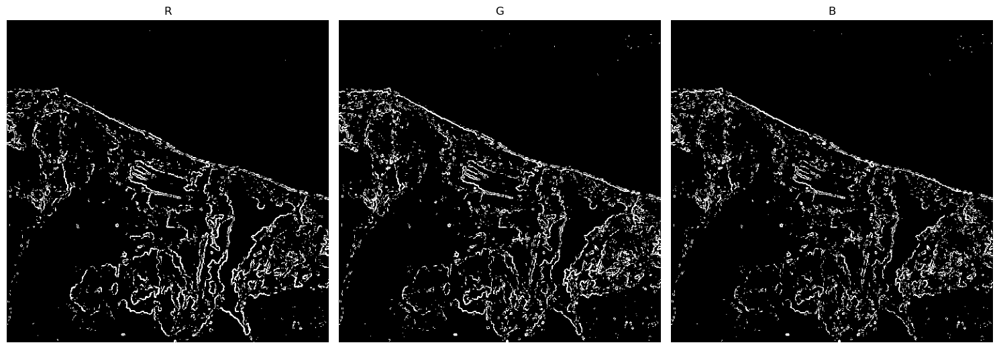

In [26]:
red, green, blue = Split_RGB(img)

red_edges, _, amplitude_red, direction_red = sobel(red, 250)
green_edges, _, amplitude_green, direction_green = sobel(green, 210)
blue_edges, _, amplitude_blue, direction_blue = sobel(blue, 210)

rgbchannels = [red_edges, green_edges, blue_edges]
amplitudes = [amplitude_red, amplitude_green, amplitude_blue]
directions = [direction_red, direction_green, direction_blue]

display_images_in_grid(rgbchannels,['R','G','B'],1,3,True,True)

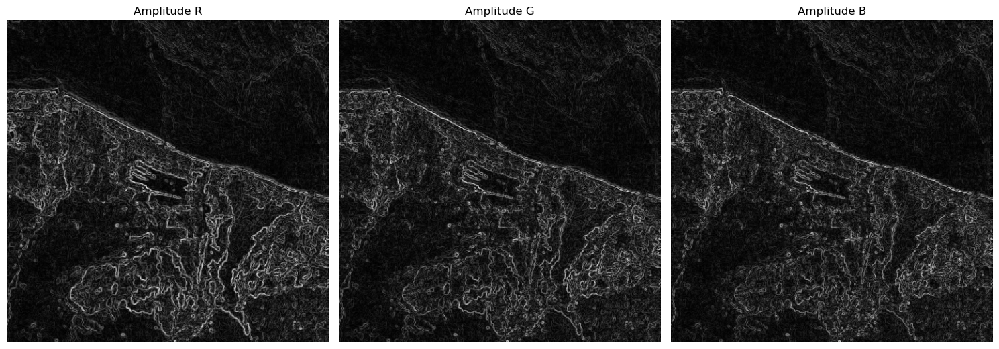

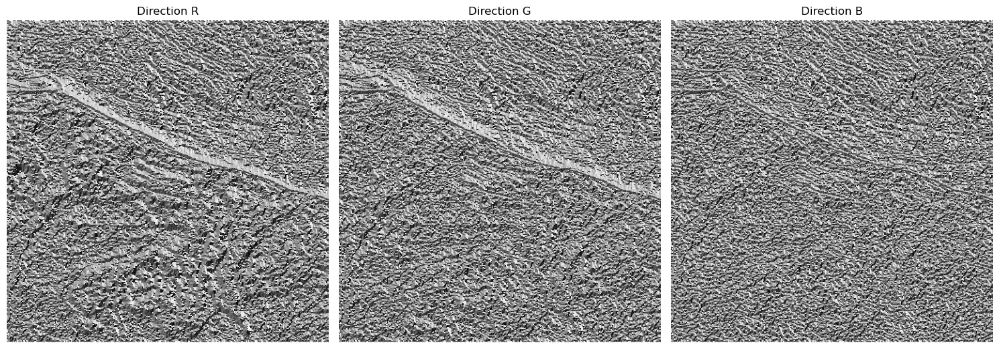

In [28]:
display_images_in_grid(amplitudes, ['Amplitude R', 'Amplitude G', 'Amplitude B'], 1, 3, True, True)

display_images_in_grid(directions, ['Direction R', 'Direction G', 'Direction B'], 1, 3, True, True)

In [30]:
def prewitt(image, threshold):
    image_array = np.array(image, dtype=np.float64)

    prewitt_x = np.array([[-1, 0, 1],
                          [-1, 0, 1],
                          [-1, 0, 1]])

    prewitt_y = np.array([[-1, -1, -1],
                          [ 0,  0,  0],
                          [ 1,  1,  1]])

    edges_x = convolve(image_array, prewitt_x)
    edges_y = convolve(image_array, prewitt_y)

    amplitude = np.sqrt(edges_x**2 + edges_y**2)
    
    direction = np.arctan2(edges_y, edges_x)

    # Convertir la magnitude des gradients en image
    edges_image = Image.fromarray(np.clip(amplitude, 0, 255).astype(np.uint8))
    
    binary_edges = (amplitude > threshold).astype(np.uint8) * 255
    
    binary_edges_image = Image.fromarray(binary_edges)

    edge_positions = np.argwhere(binary_edges)

    return binary_edges_image, edge_positions, amplitude, direction

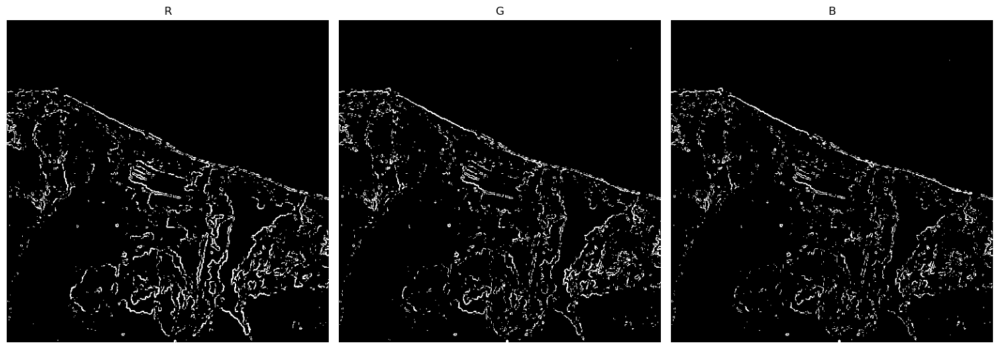

In [32]:

red_edges, _, amplitude_red, direction_red = prewitt(red, 200)
green_edges, _, amplitude_green, direction_green = prewitt(green, 180)
blue_edges, _, amplitude_blue, direction_blue = prewitt(blue, 180)

rgbchannels = [red_edges, green_edges, blue_edges]
amplitudes = [amplitude_red, amplitude_green, amplitude_blue]
directions = [direction_red, direction_green, direction_blue]

display_images_in_grid(rgbchannels,['R','G','B'],1,3,True,True)

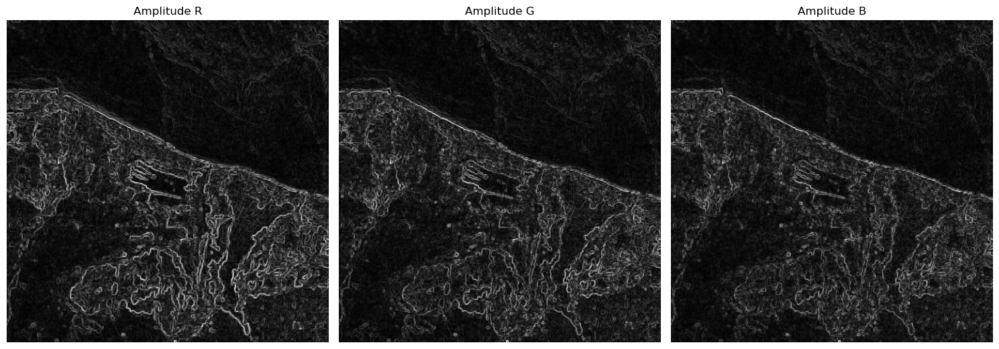

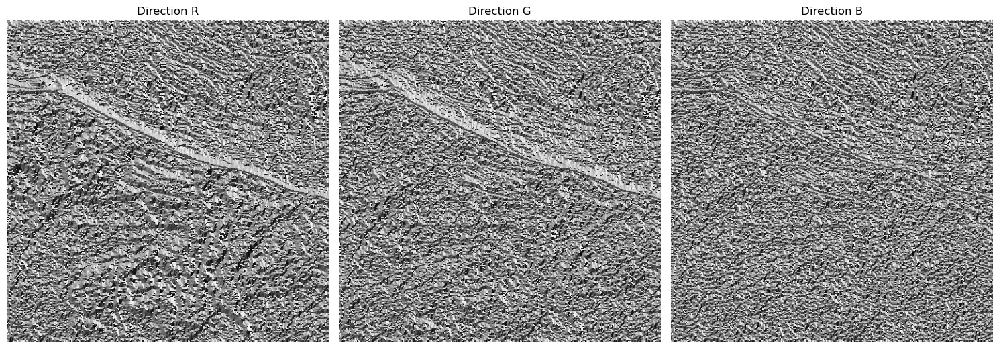

In [33]:
display_images_in_grid(amplitudes, ['Amplitude R', 'Amplitude G', 'Amplitude B'], 1, 3, True, True)

display_images_in_grid(directions, ['Direction R', 'Direction G', 'Direction B'], 1, 3, True, True)

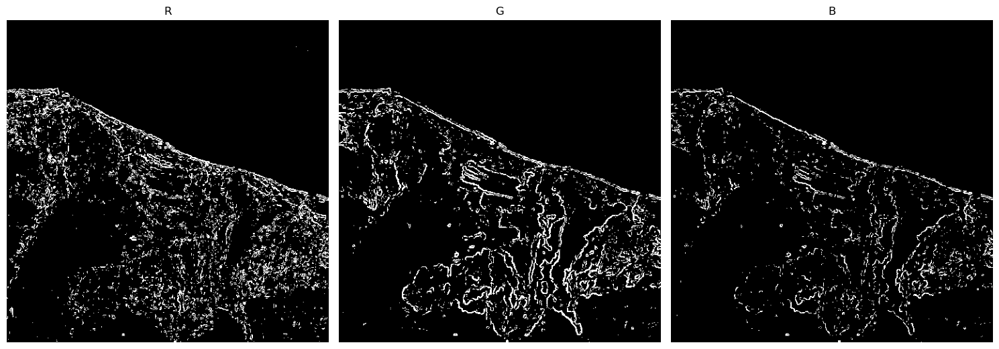

In [36]:
red2, green2, blue2 = Split_RGB(img2)

red_edges2, _, amplitude_red2, direction_red2 = sobel(red2, 160)
green_edges2, _, amplitude_green2, direction_green2 = sobel(green2, 210)
blue_edges2, _, amplitude_blue2, direction_blue2 = sobel(blue2, 210)

rgbchannels2 = [red_edges2, green_edges2, blue_edges2]
amplitudes2 = [amplitude_red2, amplitude_green2, amplitude_blue2]
directions2 = [direction_red2, direction_green2, direction_blue2]

display_images_in_grid(rgbchannels2,['R','G','B'],1,3,True,True)

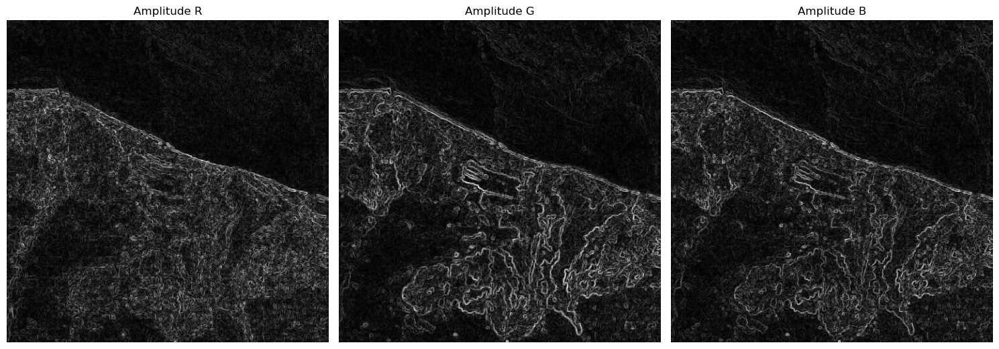

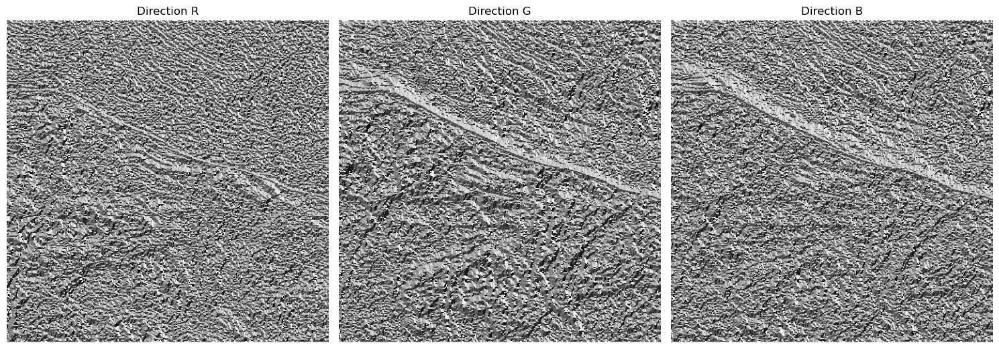

In [37]:
display_images_in_grid(amplitudes2, ['Amplitude R', 'Amplitude G', 'Amplitude B'], 1, 3, True, True)

display_images_in_grid(directions2, ['Direction R', 'Direction G', 'Direction B'], 1, 3, True, True)

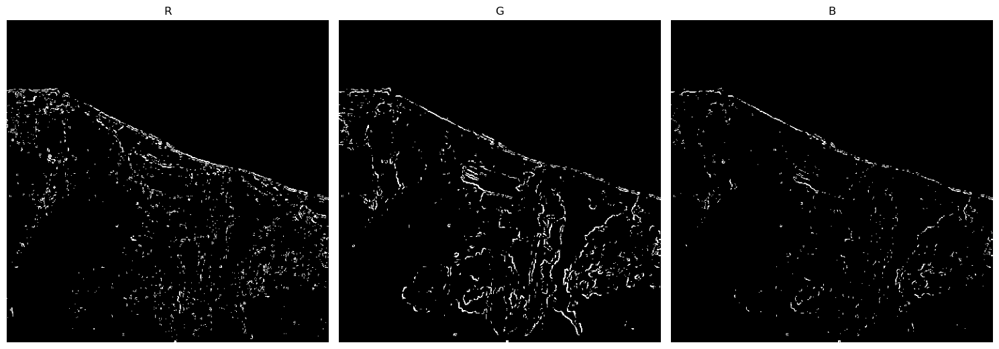

In [38]:
red_edges2, _, amplitude_red2, direction_red2 = prewitt(red2, 160)
green_edges2, _, amplitude_green2, direction_green2 = prewitt(green2, 210)
blue_edges2, _, amplitude_blue2, direction_blue2 = prewitt(blue2, 210)

rgbchannels2 = [red_edges2, green_edges2, blue_edges2]
amplitudes2 = [amplitude_red2, amplitude_green2, amplitude_blue2]
directions2 = [direction_red2, direction_green2, direction_blue2]

display_images_in_grid(rgbchannels2,['R','G','B'],1,3,True,True)

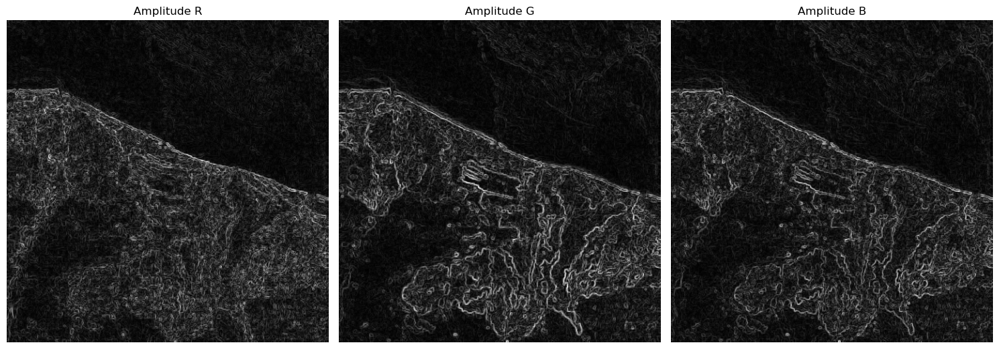

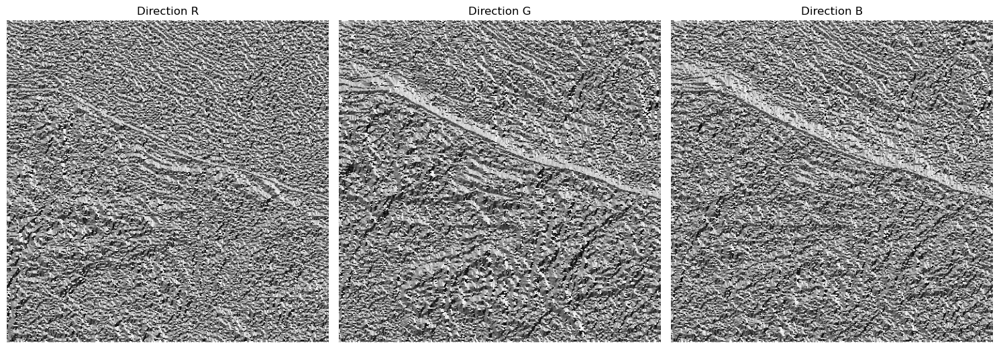

In [39]:
display_images_in_grid(amplitudes2, ['Amplitude R', 'Amplitude G', 'Amplitude B'], 1, 3, True, True)

display_images_in_grid(directions2, ['Direction R', 'Direction G', 'Direction B'], 1, 3, True, True)